# Rainfall Weather Forecasting

In [37]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [38]:
df=pd.read_csv("https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv")
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [39]:
df.shape

(8425, 23)

In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [41]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [42]:
df = df.drop(['Evaporation', 'Sunshine'], axis=1)
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,W,44.0,W,WNW,20.0,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,WNW,44.0,NNW,WSW,4.0,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,WSW,46.0,W,WSW,19.0,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NE,24.0,SE,E,11.0,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,W,41.0,ENE,NW,7.0,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [43]:
df= df.fillna(df.mode().iloc[0])
df

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,W,44.0,W,WNW,20.0,...,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,WNW,44.0,NNW,WSW,4.0,...,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,WSW,46.0,W,WSW,19.0,...,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NE,24.0,SE,E,11.0,...,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,W,41.0,ENE,NW,7.0,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,E,31.0,SE,ENE,13.0,...,51.0,24.0,1024.6,1020.3,7.0,7.0,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NNW,22.0,SE,N,13.0,...,56.0,21.0,1023.5,1019.1,7.0,7.0,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,N,37.0,SE,WNW,9.0,...,53.0,24.0,1021.0,1016.8,7.0,7.0,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,SE,28.0,SSE,N,13.0,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [44]:
df['Location'].unique()

array(['Albury', 'CoffsHarbour', 'Newcastle', 'Penrith', 'Williamtown',
       'Wollongong', 'Melbourne', 'Brisbane', 'Adelaide', 'PerthAirport',
       'Darwin', 'Uluru'], dtype=object)

In [45]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

<Axes: xlabel='RainTomorrow', ylabel='count'>

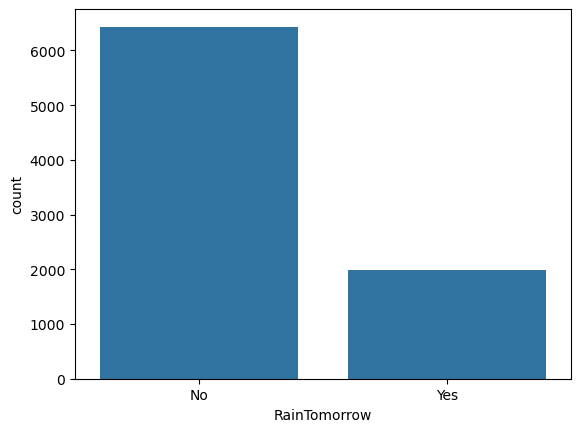

In [46]:
sns.countplot(x='RainTomorrow',data=df)

In [47]:
pd.crosstab(df['RainTomorrow'],df['Location'])

Location,Adelaide,Albury,Brisbane,CoffsHarbour,Darwin,Melbourne,Newcastle,Penrith,PerthAirport,Uluru,Williamtown,Wollongong
RainTomorrow,,,,,,,,,,,,
No,160,708,444,425,218,1216,624,366,962,39,924,348
Yes,45,199,135,186,32,406,198,116,242,0,306,126


<Axes: xlabel='Location', ylabel='RainTomorrow'>

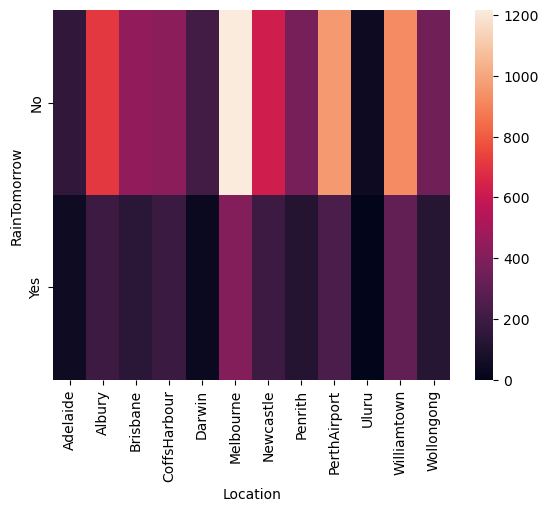

In [48]:
sns.heatmap(pd.crosstab(df['RainTomorrow'],df['Location']))

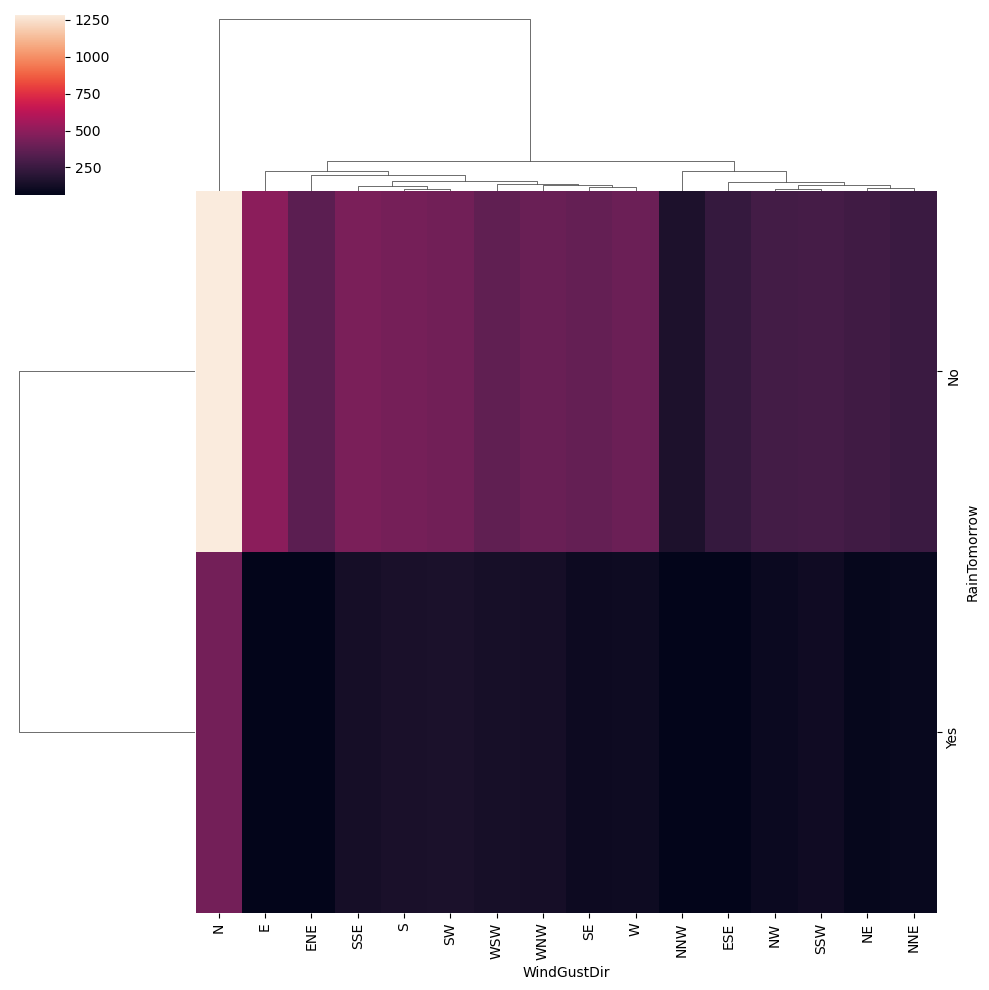

In [49]:
sns.clustermap(pd.crosstab(df['RainTomorrow'], df['WindGustDir']))

<Axes: xlabel='RainToday', ylabel='RainTomorrow'>

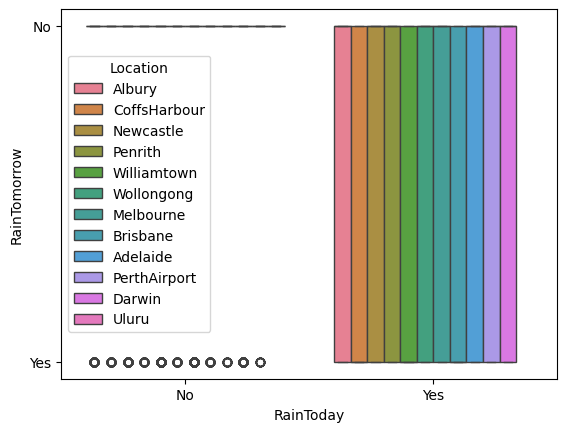

In [50]:
sns.boxplot(x=df['RainToday'],y=df['RainTomorrow'],hue='Location',data=df)

<Axes: xlabel='RainTomorrow', ylabel='Rainfall'>

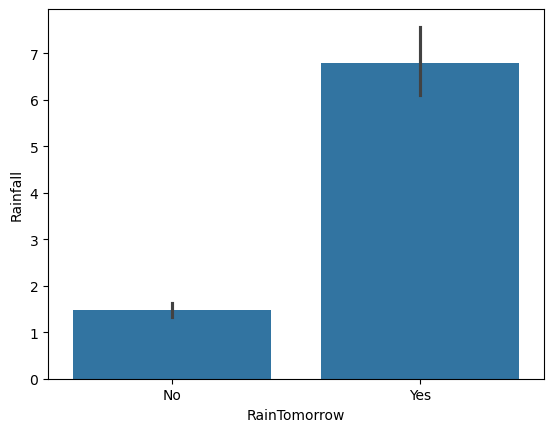

In [51]:
sns.barplot(x=df['RainTomorrow'],y=df['Rainfall'],data=df)

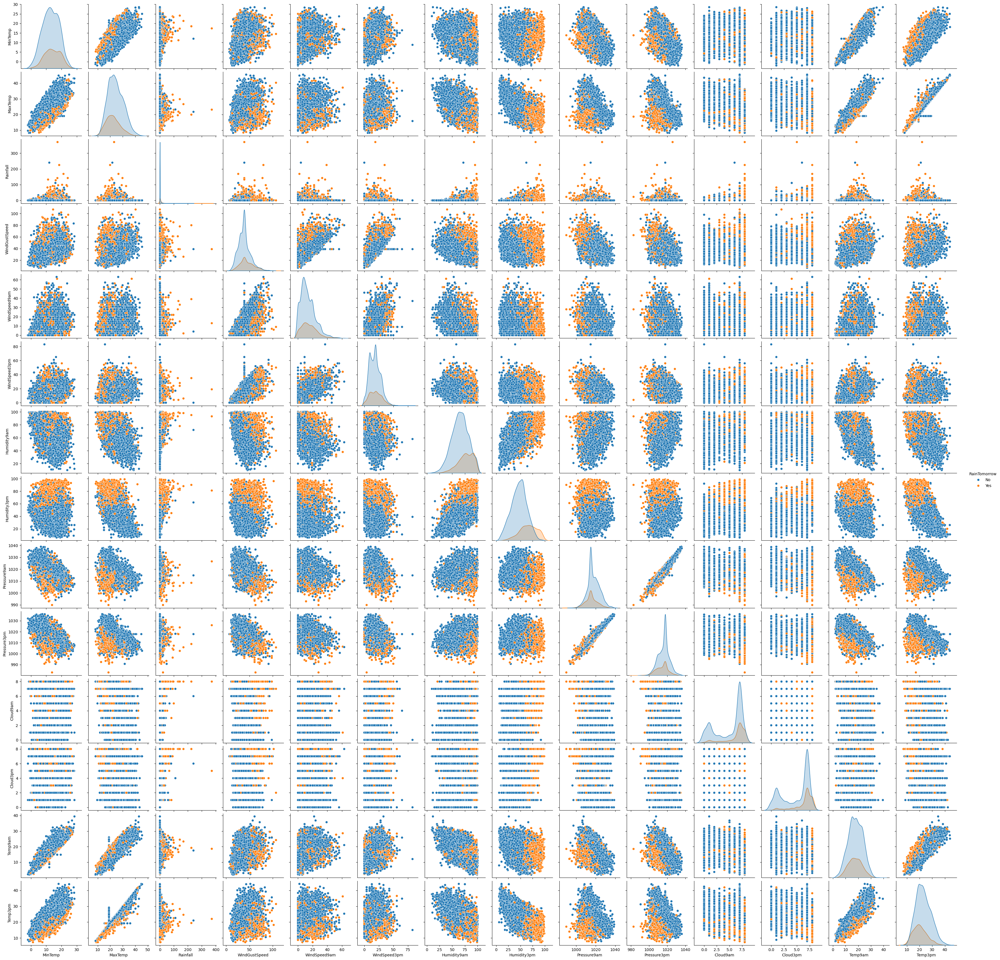

In [55]:
sns.pairplot((df),hue='RainTomorrow')

<Axes: ylabel='Frequency'>

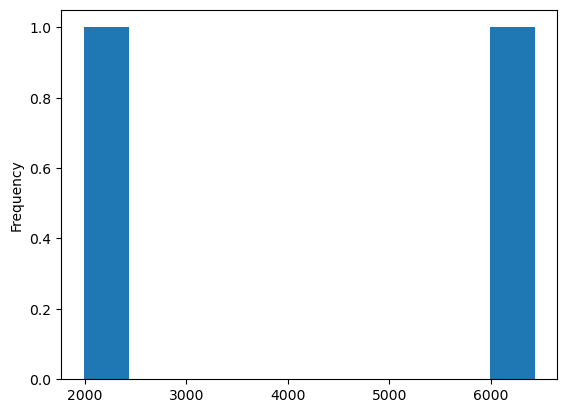

In [56]:
df['RainTomorrow'].value_counts().plot(kind='hist')

<Axes: xlabel='Rainfall', ylabel='RainTomorrow'>

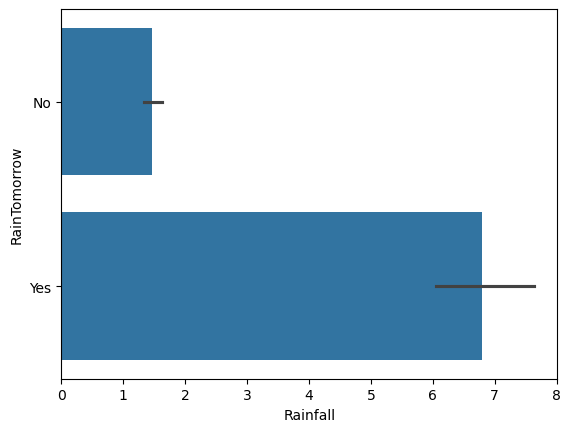

In [59]:
sns.barplot(x=df['Rainfall'], y=df['RainTomorrow'])


<Axes: ylabel='RainTomorrow'>

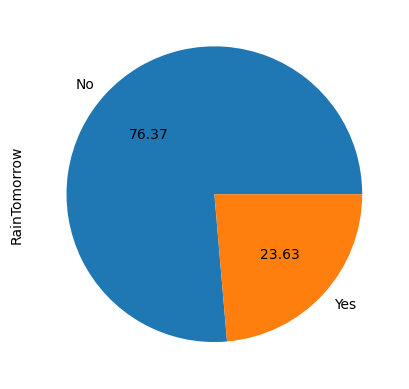

In [60]:
df['RainTomorrow'].value_counts().plot(kind='pie',autopct='%0.2f')

<Axes: xlabel='RainTomorrow', ylabel='count'>

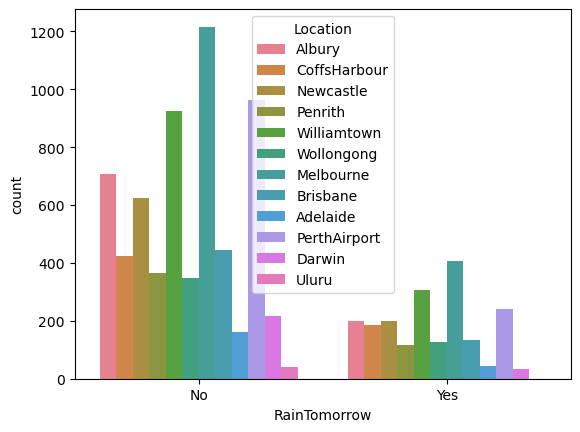

In [63]:
sns.countplot(x='RainTomorrow', hue='Location', data=df)

In [55]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8425 non-null   float64
 3   MaxTemp        8425 non-null   float64
 4   Rainfall       8425 non-null   float64
 5   WindGustDir    8425 non-null   object 
 6   WindGustSpeed  8425 non-null   float64
 7   WindDir9am     8425 non-null   object 
 8   WindDir3pm     8425 non-null   object 
 9   WindSpeed9am   8425 non-null   float64
 10  WindSpeed3pm   8425 non-null   float64
 11  Humidity9am    8425 non-null   float64
 12  Humidity3pm    8425 non-null   float64
 13  Pressure9am    8425 non-null   float64
 14  Pressure3pm    8425 non-null   float64
 15  Cloud9am       8425 non-null   float64
 16  Cloud3pm       8425 non-null   float64
 17  Temp9am        8425 non-null   float64
 18  Temp3pm 

In [56]:
df.drop('Date',axis=1,inplace=True)
df

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,Albury,13.4,22.9,0.6,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,No,No
1,Albury,7.4,25.1,0.0,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,No,No
2,Albury,12.9,25.7,0.0,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,No,No
3,Albury,9.2,28.0,0.0,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,No,No
4,Albury,17.5,32.3,1.0,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.4,0.0,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,7.0,7.0,10.1,22.4,No,No
8421,Uluru,3.6,25.3,0.0,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,7.0,7.0,10.9,24.5,No,No
8422,Uluru,5.4,26.9,0.0,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,7.0,7.0,12.5,26.1,No,No
8423,Uluru,7.8,27.0,0.0,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [57]:
df['Location'].unique()

array(['Albury', 'CoffsHarbour', 'Newcastle', 'Penrith', 'Williamtown',
       'Wollongong', 'Melbourne', 'Brisbane', 'Adelaide', 'PerthAirport',
       'Darwin', 'Uluru'], dtype=object)

In [58]:
df['Location']=df['Location'].map({'Albury':1, 'CoffsHarbour':2, 'Newcastle':3, 'Penrith':4, 'Williamtown':5,'Wollongong':6, 'Melbourne':7, 'Brisbane':8, 'Adelaide':9, 'PerthAirport':10,'Darwin':11, 'Uluru':12})
df['WindGustDir']=df['WindGustDir'].map({'W':1, 'WNW':2, 'WSW':3, 'NE':4, 'NNW':5, 'N':6, 'NNE':7, 'SW':8, 'ENE':9, 'SSE':10,'S':11, 'NW':12, 'SE':13, 'ESE':14, 'E':15, 'SSW':16})
df['WindDir9am']=df['WindDir9am'].map({'W':1, 'WNW':2, 'WSW':3, 'NE':4, 'NNW':5, 'N':6, 'NNE':7, 'SW':8, 'ENE':9, 'SSE':10,'S':11, 'NW':12, 'SE':13, 'ESE':14, 'E':15, 'SSW':16})
df['WindDir3pm']=df['WindDir3pm'].map({'W':1, 'WNW':2, 'WSW':3, 'NE':4, 'NNW':5, 'N':6, 'NNE':7, 'SW':8, 'ENE':9, 'SSE':10,'S':11, 'NW':12, 'SE':13, 'ESE':14, 'E':15, 'SSW':16})
df['RainToday']=df['RainToday'].map({'Yes':1,'No':0})

In [60]:
df

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1,13.4,22.9,0.6,1,44.0,1,2,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,0,No
1,1,7.4,25.1,0.0,2,44.0,5,3,4.0,22.0,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,0,No
2,1,12.9,25.7,0.0,3,46.0,1,3,19.0,26.0,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,0,No
3,1,9.2,28.0,0.0,4,24.0,13,15,11.0,9.0,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,0,No
4,1,17.5,32.3,1.0,1,41.0,9,12,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,12,2.8,23.4,0.0,15,31.0,13,9,13.0,11.0,51.0,24.0,1024.6,1020.3,7.0,7.0,10.1,22.4,0,No
8421,12,3.6,25.3,0.0,5,22.0,13,6,13.0,9.0,56.0,21.0,1023.5,1019.1,7.0,7.0,10.9,24.5,0,No
8422,12,5.4,26.9,0.0,6,37.0,13,2,9.0,9.0,53.0,24.0,1021.0,1016.8,7.0,7.0,12.5,26.1,0,No
8423,12,7.8,27.0,0.0,13,28.0,10,6,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,0,No


In [61]:
from sklearn.preprocessing import LabelEncoder
df['RainTomorrow'] = LabelEncoder().fit_transform(df['RainTomorrow'])
df

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1,13.4,22.9,0.6,1,44.0,1,2,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,0,0
1,1,7.4,25.1,0.0,2,44.0,5,3,4.0,22.0,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,0,0
2,1,12.9,25.7,0.0,3,46.0,1,3,19.0,26.0,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,0,0
3,1,9.2,28.0,0.0,4,24.0,13,15,11.0,9.0,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,0,0
4,1,17.5,32.3,1.0,1,41.0,9,12,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,12,2.8,23.4,0.0,15,31.0,13,9,13.0,11.0,51.0,24.0,1024.6,1020.3,7.0,7.0,10.1,22.4,0,0
8421,12,3.6,25.3,0.0,5,22.0,13,6,13.0,9.0,56.0,21.0,1023.5,1019.1,7.0,7.0,10.9,24.5,0,0
8422,12,5.4,26.9,0.0,6,37.0,13,2,9.0,9.0,53.0,24.0,1021.0,1016.8,7.0,7.0,12.5,26.1,0,0
8423,12,7.8,27.0,0.0,13,28.0,10,6,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,0,0


In [62]:
df.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'WindGustDir',
       'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am',
       'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am',
       'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm',
       'RainToday', 'RainTomorrow'],
      dtype='object')

In [85]:
from scipy.stats import zscore
out_features=df[['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'WindGustDir',
       'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am',
       'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am',
       'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm',
       'RainToday', 'RainTomorrow']]
z=np.abs(zscore(out_features))    #
z

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,1.595715,0.040391,0.151011,0.206021,1.630720,0.287630,1.653206,1.509214,0.611153,0.572321,0.187215,1.599484,1.493738,1.357790,1.025166,0.690047,0.150064,0.101753,0.556099,0.556282
1,1.595715,1.074781,0.208009,0.264165,1.401866,0.287630,0.715497,1.287329,0.967014,0.367461,1.421959,1.435688,1.037704,1.246435,0.650214,0.690047,0.096617,0.318031,0.556099,0.556282
2,1.595715,0.052540,0.305923,0.264165,1.173012,0.432763,1.653206,1.287329,0.512518,0.777182,1.779553,1.162693,1.509464,1.103264,0.650214,1.260055,0.580367,0.133326,0.556099,0.556282
3,1.595715,0.740229,0.681262,0.264165,0.944157,1.163698,1.159921,1.375293,0.276566,0.964134,1.362360,1.927077,0.063067,0.451043,0.650214,0.690047,0.063721,0.687441,0.556099,0.556282
4,1.595715,0.802425,1.382983,0.167258,1.630720,0.069931,0.222212,0.709637,0.671107,0.162600,0.842805,0.998897,1.006254,1.532776,0.650214,1.080067,0.010275,1.224763,0.556099,0.556282
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2.084703,1.929746,0.069416,0.264165,1.573242,0.655733,1.159921,0.043982,0.079295,0.759274,1.004766,1.490286,1.163839,0.742046,0.650214,0.690047,1.361509,0.001004,0.556099,0.556282
8421,2.084703,1.781056,0.240647,0.264165,0.715303,1.308831,1.159921,0.621673,0.079295,0.964134,0.706770,1.654083,0.990861,0.551152,0.650214,0.690047,1.218986,0.351614,0.556099,0.556282
8422,2.084703,1.446505,0.501752,0.264165,0.486448,0.220335,1.159921,1.509214,0.473836,0.964134,0.885568,1.490286,0.597728,0.185271,0.650214,0.690047,0.933940,0.620275,0.556099,0.556282
8423,2.084703,1.000436,0.518071,0.264165,1.115533,0.873433,0.456639,0.621673,0.079295,1.168995,1.004766,1.490286,0.346123,0.137548,0.849595,1.260055,0.470740,0.603484,0.556099,0.556282


In [86]:
np.where(z>3)

(array([  12,   12,   44,   44,   52,   52,   60,   60,   61,   61,   62,
          62,   62,   67,   68,   68,  123,  267,  296,  381,  381,  405,
         406,  407,  407,  431,  462,  466,  563,  568,  568,  569,  683,
         683,  699,  713,  748,  770,  796,  797,  802,  928,  935,  949,
         979,  980,  980,  980, 1008, 1009, 1011, 1138, 1148, 1149, 1151,
        1189, 1202, 1203, 1237, 1241, 1264, 1265, 1357, 1411, 1412, 1413,
        1479, 1480, 1481, 1513, 1535, 1587, 1644, 1661, 1665, 1673, 1680,
        1774, 1819, 1873, 1898, 1903, 1945, 2016, 2028, 2043, 2063, 2074,
        2108, 2116, 2186, 2201, 2219, 2219, 2230, 2231, 2265, 2429, 2488,
        2500, 2505, 2527, 2527, 2541, 2593, 2676, 2677, 2735, 2849, 2859,
        2890, 2898, 2900, 2901, 2909, 3003, 3051, 3051, 3058, 3059, 3059,
        3060, 3066, 3067, 3067, 3067, 3068, 3070, 3082, 3082, 3082, 3089,
        3089, 3099, 3099, 3141, 3153, 3167, 3172, 3212, 3212, 3234, 3248,
        3271, 3278, 3278, 3291, 3291, 

In [87]:
df1=df[(z<3).all(axis=1)]
df1.shape

(8062, 20)

In [88]:
print("data loss percentage:",((df.shape[0]-df1.shape[0])/df.shape[0])*100)

data loss percentage: 4.308605341246291


In [89]:
df1.corr()

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Location,1.000000,0.176056,0.151834,-0.018141,0.153758,0.158939,0.071465,-0.090013,0.285782,0.192516,-0.243977,-0.159480,0.021557,-0.097882,-0.201827,-0.196929,0.186922,0.148368,-0.036671,-0.041440
MinTemp,0.176056,1.000000,0.717205,0.086688,0.154811,0.231228,0.148512,0.089331,0.141994,0.189839,-0.127375,0.088449,-0.415236,-0.435744,0.010965,-0.042991,0.888220,0.688595,0.059052,0.089950
MaxTemp,0.151834,0.717205,1.000000,-0.136740,0.139518,0.137531,0.166589,0.019970,0.012656,0.098390,-0.383263,-0.411430,-0.324656,-0.416444,-0.244999,-0.245073,0.863567,0.973815,-0.219372,-0.148384
Rainfall,-0.018141,0.086688,-0.136740,1.000000,0.001003,0.089958,-0.016253,0.035506,0.052639,0.031744,0.291315,0.284615,-0.098801,-0.038139,0.155484,0.123067,-0.034309,-0.145040,0.697661,0.268168
WindGustDir,0.153758,0.154811,0.139518,0.001003,1.000000,-0.038659,0.295330,0.411580,0.074810,0.025510,-0.042829,-0.006135,0.137950,0.098832,-0.045193,-0.081208,0.158435,0.146209,-0.022959,-0.032049
WindGustSpeed,0.158939,0.231228,0.137531,0.089958,-0.038659,1.000000,-0.038540,-0.093953,0.583875,0.630031,-0.267984,-0.089112,-0.353247,-0.349674,-0.017847,0.010374,0.200087,0.103399,0.077136,0.181772
WindDir9am,0.071465,0.148512,0.166589,-0.016253,0.295330,-0.038540,1.000000,0.191967,0.026264,-0.015738,-0.101284,-0.063754,0.033314,0.009020,-0.049208,-0.090567,0.172433,0.176103,-0.056793,-0.061887
WindDir3pm,-0.090013,0.089331,0.019970,0.035506,0.411580,-0.093953,0.191967,1.000000,-0.052973,-0.127440,0.072905,0.120389,0.137535,0.199383,-0.021732,-0.020885,0.058210,0.017906,0.021909,0.013713
WindSpeed9am,0.285782,0.141994,0.012656,0.052639,0.074810,0.583875,0.026264,-0.052973,1.000000,0.551708,-0.358357,-0.109248,-0.082415,-0.158794,-0.040224,-0.015032,0.108161,-0.000653,0.047927,0.057303
WindSpeed3pm,0.192516,0.189839,0.098390,0.031744,0.025510,0.630031,-0.015738,-0.127440,0.551708,1.000000,-0.245133,-0.081700,-0.167866,-0.221951,-0.020268,-0.037706,0.195686,0.077314,0.023082,0.044279


<Axes: >

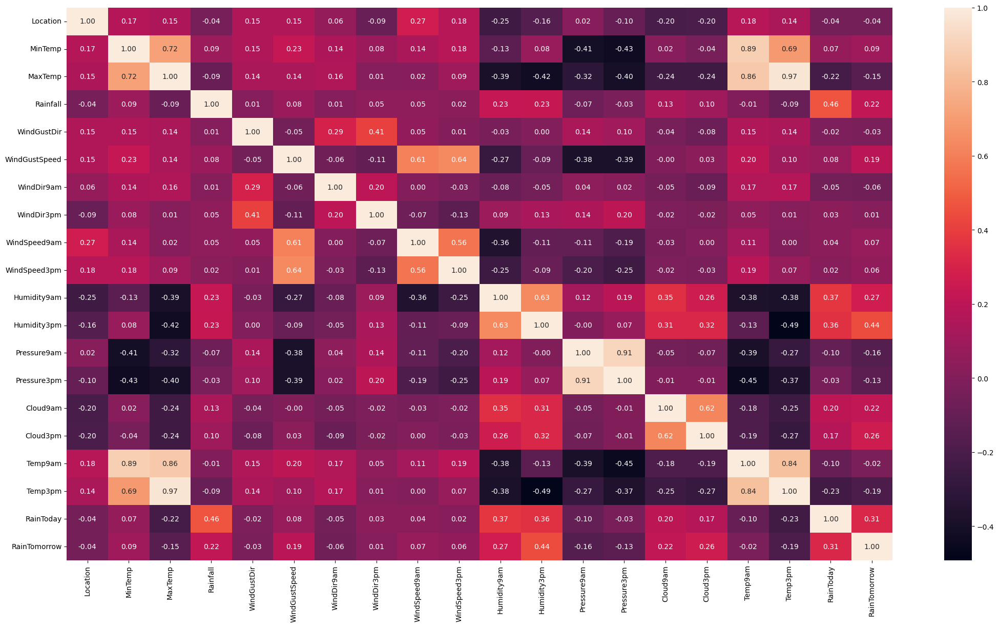

In [90]:
plt.figure(figsize=(26,14))
sns.heatmap(df.corr(),annot=True,fmt='0.2f')

In [91]:
df.corr().RainTomorrow.sort_values()

Temp3pm         -0.192463
Pressure9am     -0.162406
MaxTemp         -0.150733
Pressure3pm     -0.133191
WindDir9am      -0.055330
Location        -0.044179
WindGustDir     -0.030886
Temp9am         -0.023597
WindDir3pm       0.014795
WindSpeed3pm     0.055508
WindSpeed9am     0.067943
MinTemp          0.092657
WindGustSpeed    0.190274
Cloud9am         0.216294
Rainfall         0.219015
Cloud3pm         0.261159
Humidity9am      0.271396
RainToday        0.312929
Humidity3pm      0.444347
RainTomorrow     1.000000
Name: RainTomorrow, dtype: float64

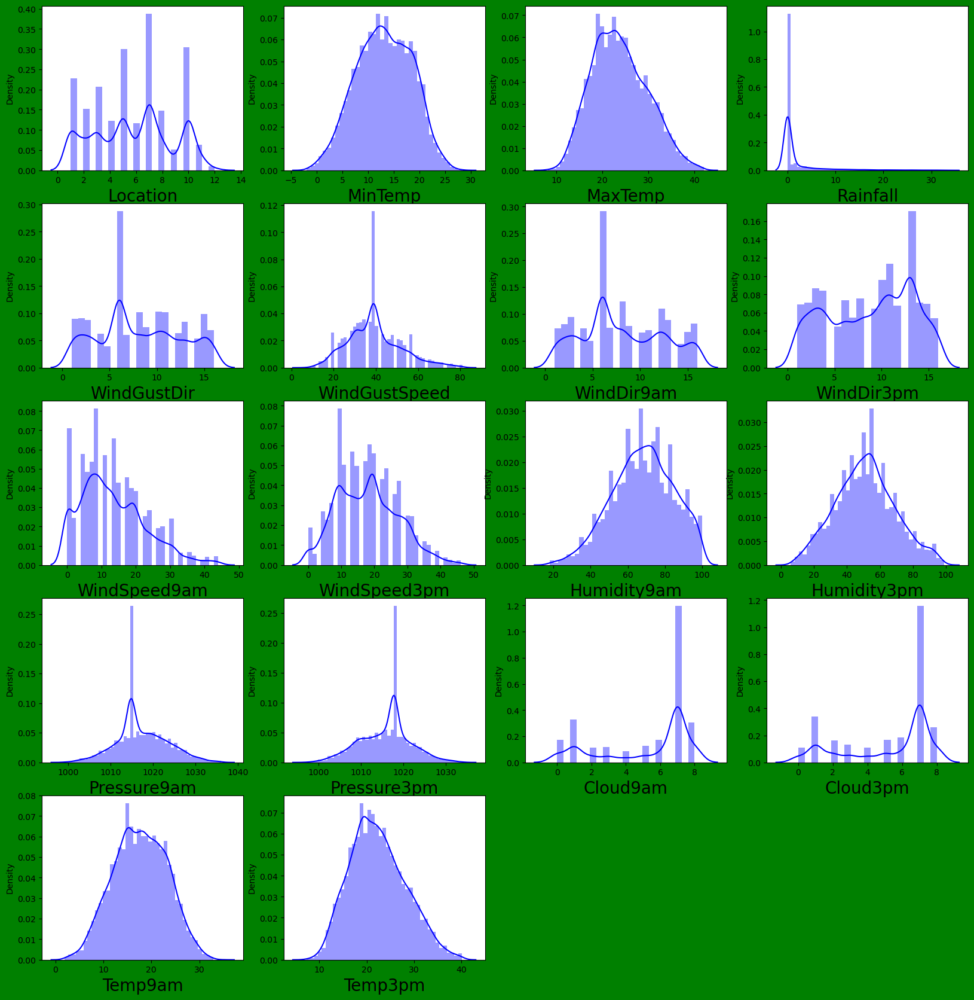

In [92]:
# checking the skewness of the data
plt.figure(figsize=(20,25),facecolor="green")
plotnumber=1
for column in df1:
    if plotnumber<=18:
        ax=plt.subplot(6,4,plotnumber)
        sns.distplot(df1[column],color='b')
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

In [93]:
x=df1.drop(['RainTomorrow'],axis=1)
y=df1['RainTomorrow']
print("feature dimensions",x.shape)
print("label dimension",y.shape)

feature dimensions (8062, 19)
label dimension (8062,)


In [94]:
#Feature Scaling using Standard Scalarisation
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,-1.586346,0.054317,-0.145218,-0.264485,-1.633595,0.373581,-1.656762,-1.520062,0.716259,0.645210,0.183334,-1.624561,-1.580673,-1.446639,1.033393,0.701379,-0.139954,-0.097965,-0.541891
1,-1.586346,-1.060128,0.219656,-0.390259,-1.404992,0.373581,-0.721526,-1.297500,-0.984087,0.429802,-1.456567,-1.458077,-1.104768,-1.329944,0.659360,0.701379,-0.086195,0.328654,-0.541891
2,-1.586346,-0.038554,0.319167,-0.390259,-1.176389,0.530307,-1.656762,-1.297500,0.609988,0.860619,-1.820990,-1.180603,-1.597084,-1.179907,0.659360,-1.243491,0.594750,0.140942,-0.541891
3,-1.586346,-0.725794,0.700626,-0.390259,-0.947786,-1.193682,1.148948,1.373252,-0.240186,-0.970354,-1.395830,-1.957530,0.043968,-0.496406,0.659360,0.701379,0.075081,0.704078,-0.541891
4,-1.586346,0.815854,1.413789,-0.180635,-1.633595,0.138491,0.213711,0.705564,-0.665272,0.214393,0.851442,-1.014119,-1.071947,-1.630017,0.659360,1.090353,0.021323,1.250149,-0.541891
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8057,2.069588,-1.914535,-0.062292,-0.390259,1.566846,-0.645140,1.148948,0.037876,-0.027642,-0.754945,-1.031408,-1.513572,1.192704,0.753899,0.659360,0.701379,-1.358487,0.004424,-0.541891
8058,2.069588,-1.765943,0.252826,-0.390259,-0.719183,-1.350409,1.148948,-0.629812,-0.027642,-0.970354,-0.727722,-1.680056,1.012188,0.553850,0.659360,0.701379,-1.215130,0.362783,-0.541891
8059,2.069588,-1.431609,0.518189,-0.390259,-0.490580,-0.174961,1.148948,-1.520062,-0.452729,-0.970354,-0.909934,-1.513572,0.601925,0.170423,0.659360,0.701379,-0.928417,0.635819,-0.541891
8060,2.069588,-0.985831,0.534774,-0.390259,1.109640,-0.880230,0.447520,-0.629812,-0.027642,-1.185762,-1.031408,-1.513572,0.339357,0.120411,-0.836773,-1.243491,-0.462507,0.618754,-0.541891


In [95]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["VIF values"]=[variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif["Features"]=x.columns

vif

,VIF values,Features
0,1.308604,Location
1,8.095556,MinTemp
2,24.474990,MaxTemp
3,1.986697,Rainfall
4,1.382727,WindGustDir
5,2.278496,WindGustSpeed
6,1.139573,WindDir9am
7,1.357999,WindDir3pm
8,2.106392,WindSpeed9am
9,1.944808,WindSpeed3pm


In [96]:
#Modelling
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import LinearRegression


In [97]:
# finding the best random state
maxacc=0
maxrs=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.10,random_state=i)
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    acc=r2_score(y_test,pred)   # to find difference between the predicted and actual value
    if acc>maxacc: 
        maxacc=acc
        maxrs=i
print("Maximum score is",maxacc,"on Random state",maxrs)

Maximum score is 0.3532780776800356 on Random state 77


In [98]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.10,random_state=maxrs)

In [99]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.linear_model import Lasso,Ridge

In [100]:
LR=LinearRegression()
LR.fit(x_train,y_train)
pred_LR=LR.predict(x_test)
pred_train=LR.predict(x_train)
print('R2 score: ',r2_score(y_test,pred_LR))
print('R2 score on training data: ',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error',mean_absolute_error(y_test,pred_LR))
print('Mean Squared Error',mean_squared_error(y_test,pred_LR))
print('Root mean squared Error',np.sqrt(mean_squared_error(y_test,pred_LR)))

R2 score:  0.3532780776800356
R2 score on training data:  28.50126318527918
Mean Absolute Error 0.26225189112235747
Mean Squared Error 0.1189235308297589
Root mean squared Error 0.34485291187658385


In [101]:
RFR=RandomForestRegressor()
RFR.fit(x_train,y_train)
pred_RFR=RFR.predict(x_test)
pred_train=RFR.predict(x_train)
print('R2 score: ',r2_score(y_test,pred_RFR))
print('R2 score on training data: ',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error',mean_absolute_error(y_test,pred_RFR))
print('Mean Squared Error',mean_squared_error(y_test,pred_RFR))
print('Root mean squared Error',np.sqrt(mean_squared_error(y_test,pred_RFR)))

R2 score:  0.5884271011496174
R2 score on training data:  93.72219541822476
Mean Absolute Error 0.17848452257423392
Mean Squared Error 0.07568276354317077
Root mean squared Error 0.2751050045767448


In [102]:
knn=KNN()
knn.fit(x_train,y_train)
pred_knn=knn.predict(x_test)
pred_train=knn.predict(x_train)
print('R2 score: ',r2_score(y_test,pred_knn))
print('R2 score on training data: ',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error',mean_absolute_error(y_test,pred_knn))
print('Mean Squared Error',mean_squared_error(y_test,pred_knn))
print('Root mean squared Error',np.sqrt(mean_squared_error(y_test,pred_knn)))

R2 score:  0.3185824509836668
R2 score on training data:  53.6386168517041
Mean Absolute Error 0.21759603469640648
Mean Squared Error 0.12530359355638165
Root mean squared Error 0.35398247634082347


In [103]:
from sklearn.ensemble import GradientBoostingRegressor

GBR=GradientBoostingRegressor()
GBR.fit(x_train,y_train)
pred_GBR=GBR.predict(x_test)
pred_train=GBR.predict(x_train)
print('R2 score: ',r2_score(y_test,pred_GBR))
print('R2 score on training data: ',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error',mean_absolute_error(y_test,pred_GBR))
print('Mean Squared Error',mean_squared_error(y_test,pred_GBR))
print('Root mean squared Error',np.sqrt(mean_squared_error(y_test,pred_GBR)))

R2 score:  0.43560464897159057
R2 score on training data:  42.54595633968133
Mean Absolute Error 0.22665247382737103
Mean Squared Error 0.10378477304035506
Root mean squared Error 0.3221564418731295


In [104]:
ls=Lasso()
ls.fit(x_train,y_train)
pred_ls=ls.predict(x_test)
pred_train=ls.predict(x_train)
print('R2 score: ',r2_score(y_test,pred_ls))
print('R2 score on training data: ',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error',mean_absolute_error(y_test,pred_ls))
print('Mean Squared Error',mean_squared_error(y_test,pred_ls))
print('Root mean squared Error',np.sqrt(mean_squared_error(y_test,pred_ls)))

R2 score:  -0.0015645433807796039
R2 score on training data:  0.0
Mean Absolute Error 0.3590507593361669
Mean Squared Error 0.1841743533688476
Root mean squared Error 0.4291553953626211


In [105]:
rd=Ridge()
rd.fit(x_train,y_train)
pred_rd=rd.predict(x_test)
pred_train=rd.predict(x_train)
print('R2 score: ',r2_score(y_test,pred_rd))
print('R2 score on training data: ',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error',mean_absolute_error(y_test,pred_rd))
print('Mean Squared Error',mean_squared_error(y_test,pred_rd))
print('Root mean squared Error',np.sqrt(mean_squared_error(y_test,pred_rd)))

R2 score:  0.35326509666014194
R2 score on training data:  28.501260031945463
Mean Absolute Error 0.26226027839319815
Mean Squared Error 0.11892591786608202
Root mean squared Error 0.34485637280769804


In [106]:
from sklearn.tree import DecisionTreeRegressor 

dtr=DecisionTreeRegressor()
dtr.fit(x_train,y_train)
pred_dtr=dtr.predict(x_test)
pred_train=dtr.predict(x_train)
print('R2 score: ',r2_score(y_test,pred_dtr))
print('R2 score on training data: ',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error',mean_absolute_error(y_test,pred_dtr))
print('Mean Squared Error',mean_squared_error(y_test,pred_dtr))
print('Root mean squared Error',np.sqrt(mean_squared_error(y_test,pred_dtr)))

R2 score:  0.1845056711732589
R2 score on training data:  99.92834629045734
Mean Absolute Error 0.15016334347189367
Mean Squared Error 0.14995852407140003
Root mean squared Error 0.3872447857252568


In [107]:
from sklearn.svm import SVR

svr=SVR()
svr.fit(x_train,y_train)
pred_svr=dtr.predict(x_test)
pred_train=svr.predict(x_train)
print('R2 score: ',r2_score(y_test,pred_svr))
print('R2 score on training data: ',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error',mean_absolute_error(y_test,pred_svr))
print('Mean Squared Error',mean_squared_error(y_test,pred_svr))
print('Root mean squared Error',np.sqrt(mean_squared_error(y_test,pred_dtr)))

R2 score:  0.1845056711732589
R2 score on training data:  51.70676800449161
Mean Absolute Error 0.15016334347189367
Mean Squared Error 0.14995852407140003
Root mean squared Error 0.3872447857252568


In [108]:
from sklearn.ensemble import ExtraTreesRegressor

etr=ExtraTreesRegressor()
etr.fit(x_train,y_train)
pred_etr=etr.predict(x_test)
pred_train=etr.predict(x_train)
print('R2 score: ',r2_score(y_test,pred_etr))
print('R2 score on training data: ',r2_score(y_train,pred_train)*100)
print('Mean Absolute Error',mean_absolute_error(y_test,pred_etr))
print('Mean Squared Error',mean_squared_error(y_test,pred_etr))
print('Root mean squared Error',np.sqrt(mean_squared_error(y_test,pred_dtr)))

R2 score:  0.6158675085759777
R2 score on training data:  99.92834629045734
Mean Absolute Error 0.14624760617325674
Mean Squared Error 0.07063683881737279
Root mean squared Error 0.3872447857252568


In [109]:
# Cross validation score
from sklearn.model_selection import cross_val_score
score =cross_val_score(LR,x,y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score: ",(r2_score(y_test,pred_LR)-score.mean())*100)

[0.30241615 0.1692343  0.19737796 0.27022298 0.36352451]
0.2605551788854784
Difference between R2 score and cross validation score:  9.27228987945572


In [110]:
score1=cross_val_score(RFR,x,y,cv=5,scoring='r2')
print(score1)
print(score1.mean())
print("Difference between R2 score and cross validation score: ",(r2_score(y_test,pred_RFR)-score1.mean())*100)

[0.30555302 0.4045864  0.5789445  0.46432945 0.28670214]
0.40802310329813707
Difference between R2 score and cross validation score:  18.040399785148033


In [111]:
score2 =cross_val_score(knn,x,y,cv=5,scoring='r2')
print(score2)
print(score2.mean())
print("Difference between R2 score and cross validation score: ",(r2_score(y_test,pred_knn)-score2.mean())*100)

[0.18646314 0.1407722  0.29516189 0.17112835 0.13970134]
0.18664538399656944
Difference between R2 score and cross validation score:  13.193706698709734


In [112]:
score3 =cross_val_score(GBR,x,y,cv=5,scoring='r2')
print(score3)
print(score3.mean())
print("Difference between R2 score and cross validation score: ",(r2_score(y_test,pred_GBR)-score.mean())*100)

[0.3409704  0.24026314 0.2998229  0.30149579 0.34228183]
0.3049668098840503
Difference between R2 score and cross validation score:  17.504947008611214


In [113]:
score4 =cross_val_score(ls,x,y,cv=5,scoring='r2')
print(score4)
print(score4.mean())
print("Difference between R2 score and cross validation score: ",(r2_score(y_test,pred_ls)-score4.mean())*100)

[-8.00704108e-05 -1.86259627e-03 -5.12011178e-03 -6.61408081e-04
 -2.84742722e-02]
-0.007239691743041865
Difference between R2 score and cross validation score:  0.5675148362262261


In [114]:
score5 =cross_val_score(rd,x,y,cv=5,scoring='r2')
print(score5)
print(score5.mean())
print("Difference between R2 score and cross validation score: ",(r2_score(y_test,pred_rd)-score5.mean())*100)

[0.30246072 0.16951497 0.19741389 0.27023439 0.3635102 ]
0.26062683526596453
Difference between R2 score and cross validation score:  9.263826139417741


In [115]:
score6 =cross_val_score(dtr,x,y,cv=5,scoring='r2')
print(score6)
print(score6.mean())
print("Difference between R2 score and cross validation score: ",(r2_score(y_test,pred_dtr)-score6.mean())*100)

[-0.30674621  0.08513778  0.26373933 -0.07235012 -0.49167444]
-0.1043787313252968
Difference between R2 score and cross validation score:  28.888440249855567


In [116]:
score7 =cross_val_score(svr,x,y,cv=5,scoring='r2')
print(score7)
print(score7.mean())
print("Difference between R2 score and cross validation score: ",(r2_score(y_test,pred_svr)-score7.mean())*100)

[0.24964743 0.14253853 0.3372542  0.27160542 0.27689792]
0.2555887000774001
Difference between R2 score and cross validation score:  -7.1083028904141194


In [117]:
score8 =cross_val_score(etr,x,y,cv=5,scoring='r2')
print(score8)
print(score8.mean())
print("Difference between R2 score and cross validation score: ",(r2_score(y_test,pred_etr)-score8.mean())*100)

[0.32711295 0.44240262 0.62530599 0.50890661 0.34780531]
0.4503066952840532
Difference between R2 score and cross validation score:  16.556081329192452


In [118]:
# Hyper parameter tunning
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import ExtraTreesRegressor

param = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'random_state': [1, 4, 10, 20]
}

gscv = GridSearchCV(ExtraTreesRegressor(), param, cv=5)
gscv.fit(x_train, y_train)


GridSearchCV(cv=5, estimator=ExtraTreesRegressor(),
             param_grid={'max_depth': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [50, 100, 200],
                         'random_state': [1, 4, 10, 20]})

In [119]:
gscv.best_params_

{'max_depth': 30,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 200,
 'random_state': 4}

In [122]:
Model =ExtraTreesRegressor(max_depth=10,
                               min_samples_split=2,  
                               min_samples_leaf=1,
                               max_features='auto', 
                               random_state=1) 

In [123]:
Model.fit(x_train,y_train)
pred=Model.predict(x_test)
print('r2_score: ',r2_score(y_test,pred))
print('Mean Absolute error:',mean_absolute_error(y_test,pred))
print('Mean Squared error:',mean_squared_error(y_test,pred))
print('Root Mean Squared Error: ',np.sqrt(mean_squared_error(y_test,pred)))      

r2_score:  0.507685888920719
Mean Absolute error: 0.20916961096802208
Mean Squared error: 0.09052999495801203
Root Mean Squared Error:  0.3008820283067967
